# Self-Driving Car Engineer Nanodegree


## Project: Vehicle Detection and Tracking

In [1]:
import os
import shutil
import glob
import time
from tqdm import tqdm
from collections import deque

import numpy as np
import cv2

from mpl_toolkits.mplot3d import Axes3D
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

from skimage.feature import hog
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.svm import LinearSVC, SVC
from scipy.ndimage.measurements import label

from moviepy.editor import VideoFileClip
from IPython.display import HTML

## Visualization Helpers
Define functions to facilitate various data visualizations.

In [2]:
### Plot thumbnails in a grid
def plot_image_grid(image_data, index_array, title_data, images_per_row=10, fig_size=(18, 6)):

    # Create subplot grid
    no_of_rows = int(np.ceil(len(index_array) / images_per_row))
    fig, axarr = plt.subplots(no_of_rows, images_per_row, figsize=fig_size)
    if axarr.ndim == 1:
        axarr = np.expand_dims(axarr, axis=0)
    fig.tight_layout()

    # Plot images in a grid
    for row in range(no_of_rows):
        for col in range(images_per_row):
            current_subplot = images_per_row*row+col
            if (current_subplot < len(index_array)):
                current_image = image_data[index_array[current_subplot]].squeeze()
                axarr[row, col].imshow(current_image, interpolation="nearest", cmap="gray")
                
                # Hide subplot axes
                axarr[row, col].get_xaxis().set_visible(False)
                axarr[row, col].get_yaxis().set_visible(False)
                axarr[row, col].set_title(title_data[index_array[current_subplot]])
            else:
                # All images are visible, hide bounding box
                axarr[row, col].axis('off')

In [3]:
### Plot an original and a transformed image side by side
def plot_image_transform(original_image, transformed_image, transformed_title):
   
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    fig.tight_layout()
    
    # Plot original image
    ax1.imshow(original_image)
    _ = ax1.set_title("Original Image")
    
    # Plot transformed image
    ax2.imshow(transformed_image, cmap="gray")
    _ = ax2.set_title(transformed_title)

In [4]:
### Draw bounding boxes in an image
def draw_boxes(image, bboxes, color=(0, 0, 255), line_thickness=6):

    box_image = np.copy(image)
    
    # Draw all bounding boxes in the image copy
    for current_bbox in bboxes:
        cv2.rectangle(box_image, current_bbox[0], current_bbox[1], color, line_thickness)

    return box_image

## Feature Construction
In order to detect vehicles in an image, it is necessary to build a classifier that can discriminate an image patch into the classes vehicle/non-vehicle.

### Exploration images
Create a set of images to explore how features to the classifier should be constructed.

In [5]:
### Create a tensor of test images
def create_image_test_set(image_dir, image_size):
    
    # Read image set
    images = np.empty((0,) + image_size, dtype=np.uint8)
    file_list = os.listdir(image_dir)
    file_list.sort()

    for current_image_filename in file_list:
        path_to_image = os.path.join(image_dir, current_image_filename)

        if (path_to_image.endswith(".png") or path_to_image.endswith(".jpg")):
            if (os.path.isfile(path_to_image)):
                
                # OpenCV reads images in BGR. Convert to RGB.
                current_image = cv2.imread(path_to_image) 
                current_image = cv2.cvtColor(current_image, cv2.COLOR_BGR2RGB)
                images = np.append(images, [current_image], axis = 0)
                
    return images

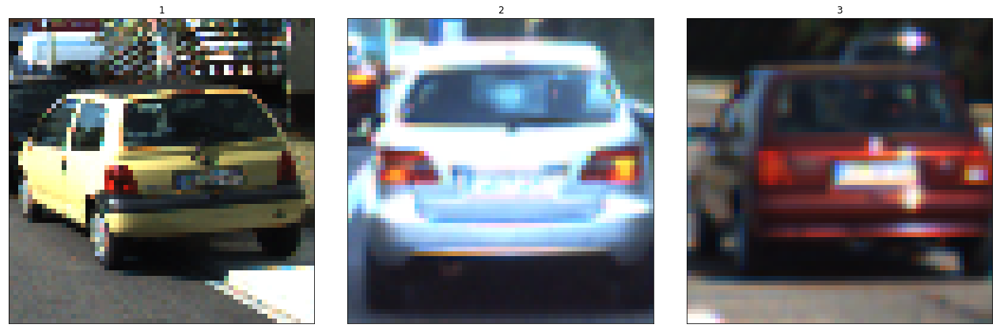

In [6]:
### Read test image set of cars
test_images_cars_dir = "./investigation_images/cars/"
test_images_cars = create_image_test_set(test_images_cars_dir, (64, 64, 3))
plot_image_grid(test_images_cars, range(0, test_images_cars.shape[0]), range(1, test_images_cars.shape[0]+1), 3)

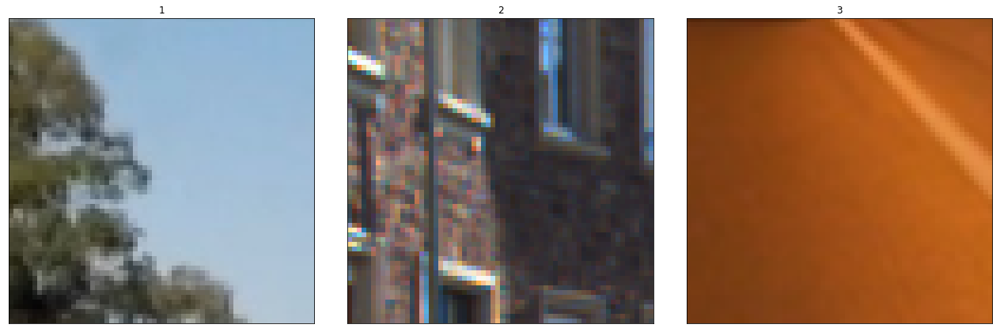

In [7]:
### Read test image set of non-cars
test_images_non_cars_dir = "./investigation_images/non_cars/"
test_images_non_cars = create_image_test_set(test_images_non_cars_dir, (64, 64, 3))
plot_image_grid(test_images_non_cars, range(0, test_images_non_cars.shape[0]), range(1, test_images_non_cars.shape[0]+1), 3)

### 1. Construct color features
Investigate the possibility of using the pixel color intensities of the image as features for the classifier.

#### Colorspace investigation
It is important that features are color invariant. Investigate which colorspace is the most suitable representation to find discriminating color features. Vehicles should be as easy as possible to separate from non-vehicles. 

In [8]:
### Plot pixels in 3D space
def plot_pixels_3d(pixels, colors_rgb, axis_labels=list("RGB"), axis_limits=((0, 255), (0, 255), (0, 255))):

    # Create figure and 3D axes
    fig = plt.figure(figsize=(8, 8))
    ax = Axes3D(fig)

    # Set axis limits
    ax.set_xlim(*axis_limits[0])
    ax.set_ylim(*axis_limits[1])
    ax.set_zlim(*axis_limits[2])

    # Set axis labels and sizes
    ax.tick_params(axis='both', which='major', labelsize=14, pad=8)
    ax.set_xlabel(axis_labels[0], fontsize=16, labelpad=16)
    ax.set_ylabel(axis_labels[1], fontsize=16, labelpad=16)
    ax.set_zlabel(axis_labels[2], fontsize=16, labelpad=16)

    # Plot pixel values with colors given in colors_rgb
    ax.scatter(
        pixels[:, :, 0].ravel(),
        pixels[:, :, 1].ravel(),
        pixels[:, :, 2].ravel(),
        c=colors_rgb.reshape((-1, 3)), edgecolors='none')

    # Draw the 3D plot on convas
    fig.canvas.draw()
    width, height = fig.canvas.get_width_height()
    image_buffer = np.fromstring(fig.canvas.tostring_rgb(), dtype='uint8')
    image = image_buffer.reshape(width, height, -1)
    
    # Suppress inline plotting
    plt.close()

    return image

In [9]:
### Plot image pixel intensities in a requested colorspace
def investigate_colorspace(original_images, colorspace="", labels="123"):
    
    image_set = np.empty((0,) + (576, 576, 3), dtype=np.uint8)

    # Split images into color
    for current_index in range(len(original_images)):
        
        # Get plotting colors
        color_values_rgb = original_images[current_index] / 255. 
        
        # Convert image to requested colorspace
        if colorspace:
            current_image = cv2.cvtColor(original_images[current_index], colorspace)
        else:
            current_image = original_images[current_index]
            
        # Equalize histogram to enhance contrast
        #current_image = cv2.equalizeHist(current_image)
        current_image = plot_pixels_3d(current_image, color_values_rgb, axis_labels=list(labels))
    
        image_set = np.append(image_set, [current_image], axis = 0)

    # Plot each color channel in image set
    plot_image_grid(image_set, range(0, image_set.shape[0]), range(1, test_images_cars.shape[0]+1), 3)

Plot car images in different color spaces.

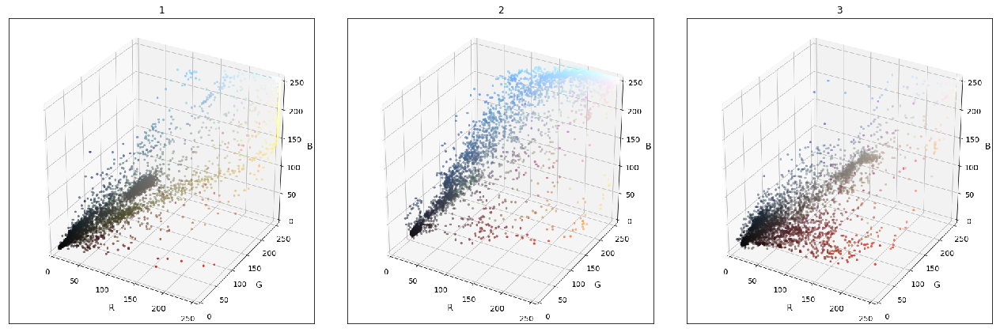

In [10]:
### RGB
investigate_colorspace(test_images_cars, "", "RGB")

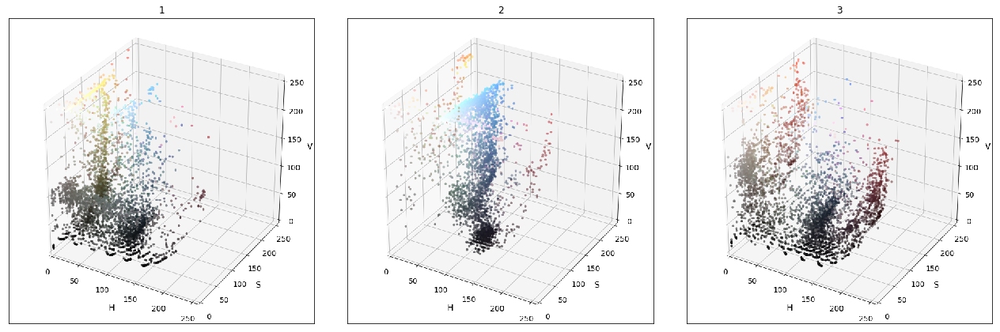

In [11]:
### HSV
investigate_colorspace(test_images_cars, cv2.COLOR_RGB2HSV, "HSV")

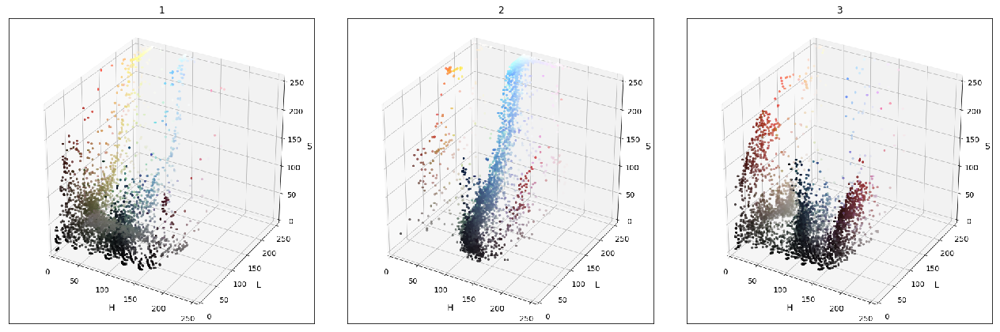

In [12]:
### HLS
investigate_colorspace(test_images_cars, cv2.COLOR_RGB2HLS, "HLS")

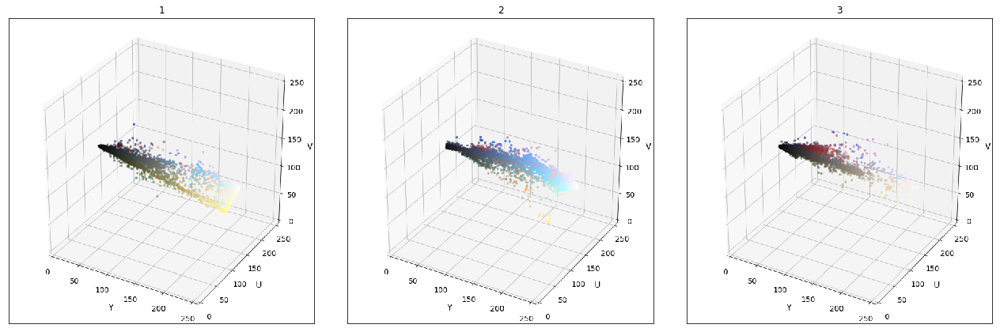

In [13]:
### YUV
investigate_colorspace(test_images_cars, cv2.COLOR_RGB2YUV, "YUV")

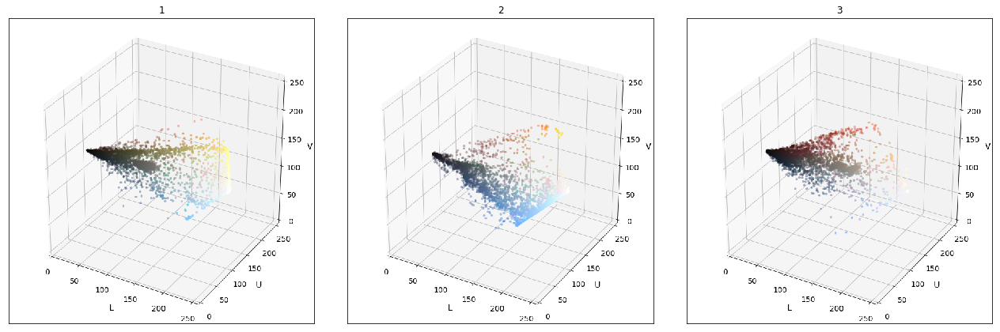

In [14]:
### LUV
investigate_colorspace(test_images_cars, cv2.COLOR_RGB2LUV, "LUV")

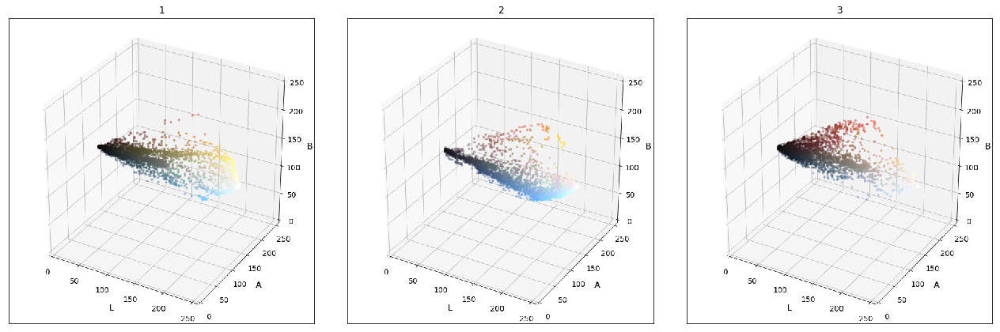

In [15]:
### LAB
investigate_colorspace(test_images_cars, cv2.COLOR_RGB2LAB, "LAB")

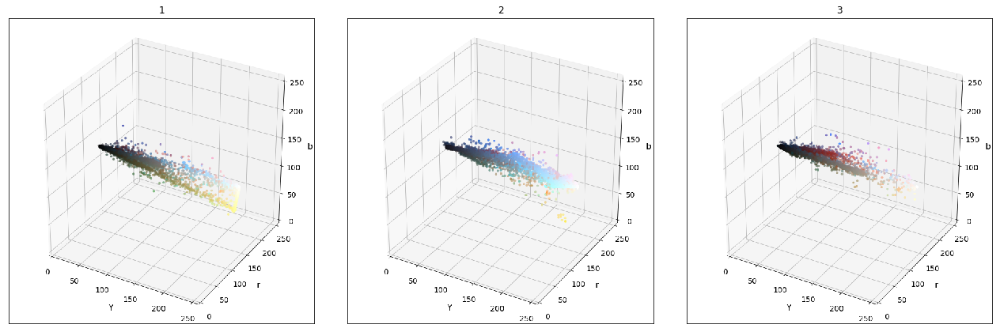

In [16]:
### YCrCb
investigate_colorspace(test_images_cars, cv2.COLOR_RGB2YCrCb, "Yrb")

A luma/chroma system like YUV and YCrCb seems most promising for collecting car pixels. How does non-car images look in those spaces?

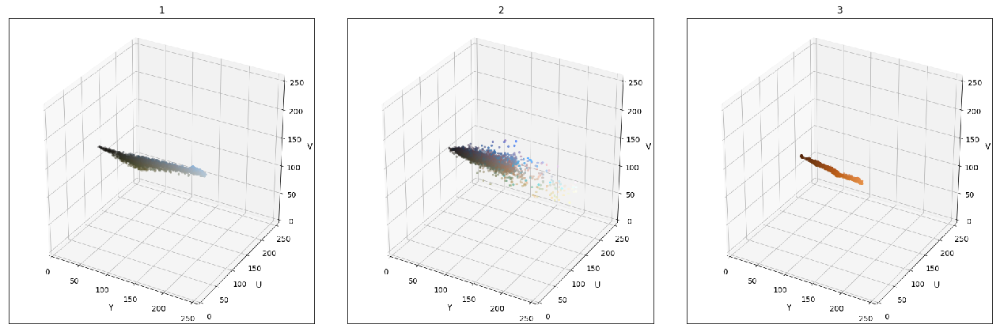

In [17]:
### YUV
investigate_colorspace(test_images_non_cars, cv2.COLOR_RGB2YUV, "YUV")

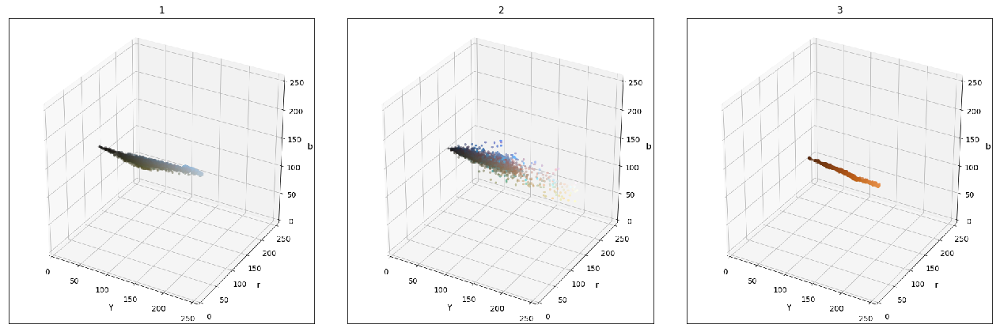

In [18]:
### YCrCb
investigate_colorspace(test_images_non_cars, cv2.COLOR_RGB2YCrCb, "Yrb")

Use YCrCb colorspace, it seems to have the biggest separation between the pixel clusters of car and non-car images.

#### Binned color intensity
Using raw pixel intensities to do template matching is not robust to differences in attributes such as form, orientation and size. Intensities can however still be useful as complementary features. To reduce feature vector size, subsample image using spatial binning.

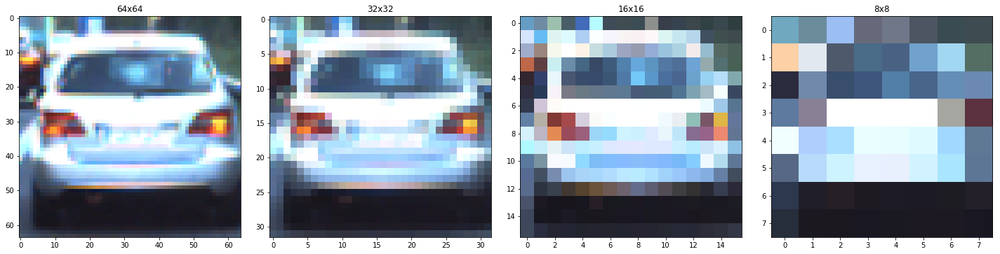

In [19]:
# Pick a test image of a car
image = np.copy(test_images_cars[1])

# Create subplot grid
fig, axarr = plt.subplots(1, 4, figsize=(20, 5))
fig.tight_layout()

# Plot different resolutions of the test image in a grid
_ = axarr[0].imshow(image)
_ = axarr[0].set_title("64x64")
_ = axarr[1].imshow(cv2.resize(image, dsize=(32, 32)))
_ = axarr[1].set_title("32x32")
_ = axarr[2].imshow(cv2.resize(image, dsize=(16, 16)))
_ = axarr[2].set_title("16x16")
_ = axarr[3].imshow(cv2.resize(image, dsize=(8, 8)))
_ = axarr[3].set_title("8x8")

The pixel intensity signature can be compress a lot and still be useful. At 8x8, things are getting a bit difficult to discern.

In [20]:
# Create binned color feature vector  
def create_color_binning_features(image, size=32):

    # Bin color intensities spatially and flatten to a feature vector
    feature_vector = cv2.resize(image, (size, size)).ravel() 

    return feature_vector

In [21]:
### Investigate color binning vector
def investigate_color_binning_vector(test_images, colorspace="", size_list=(64, 32, 16, 8, 4), *args):
    
    # Create subplot grid
    fig, axarr = plt.subplots(len(size_list)+1, test_images.shape[0], figsize=(21, 4*len(size_list)+1))
    fig.tight_layout()
    
    # Create color binning feature vectors for all test images
    for current_index in range(len(test_images)):

        # Convert image to requested colorspace
        if colorspace:
            current_image = cv2.cvtColor(test_images[current_index], colorspace)
        else:
            current_image = np.copy(test_images[current_index])

        # Plot image
        axarr[0, current_index].imshow(current_image)
        axarr[0, current_index].get_xaxis().set_visible(False)
        axarr[0, current_index].get_yaxis().set_visible(False)
        axarr[0, current_index].set_title("Image {}".format(current_index+1))

        # Iterate over all bin sizes
        size_counter = 1
        for current_size in size_list:

            # Get feature vector
            feature_vector = create_color_binning_features(current_image, current_size)

            # Plot feature vector
            axarr[size_counter, current_index].plot(feature_vector)
            axarr[size_counter, current_index].get_xaxis().set_visible(False)
            axarr[size_counter, current_index].get_yaxis().set_visible(False)
            axarr[size_counter, current_index].set_title("BinSize = {}".format(current_size))
            
            size_counter += 1

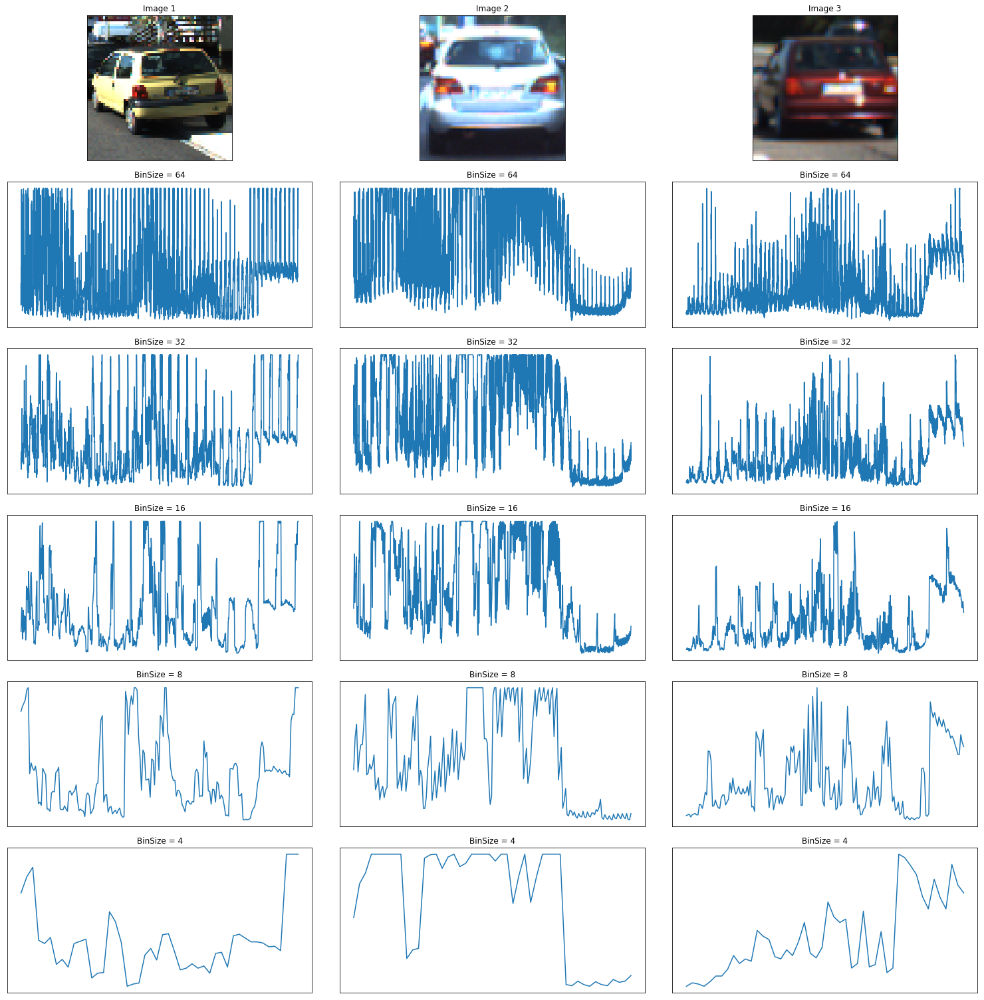

In [22]:
# Investigate color binning features for car images
investigate_color_binning_vector(test_images_cars, "")

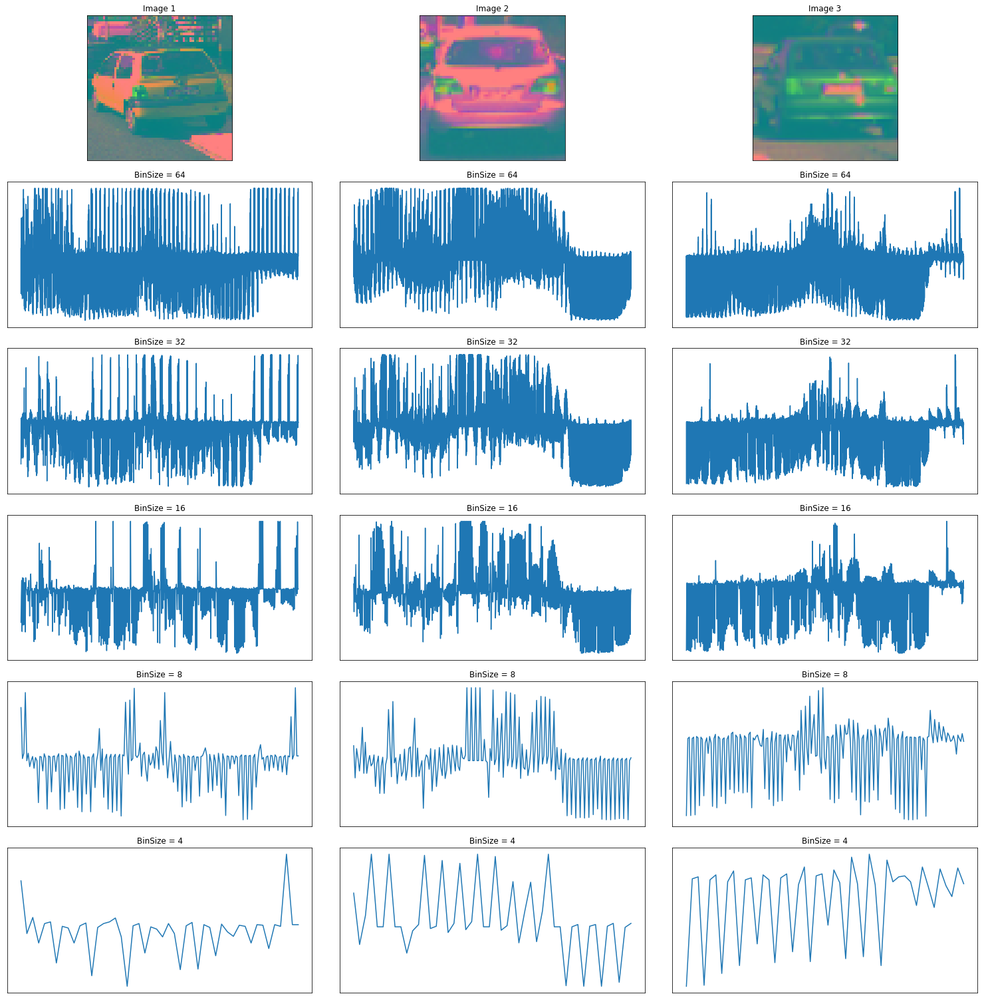

In [23]:
# Investigate color binning features for car images
investigate_color_binning_vector(test_images_cars, cv2.COLOR_RGB2YCrCb)

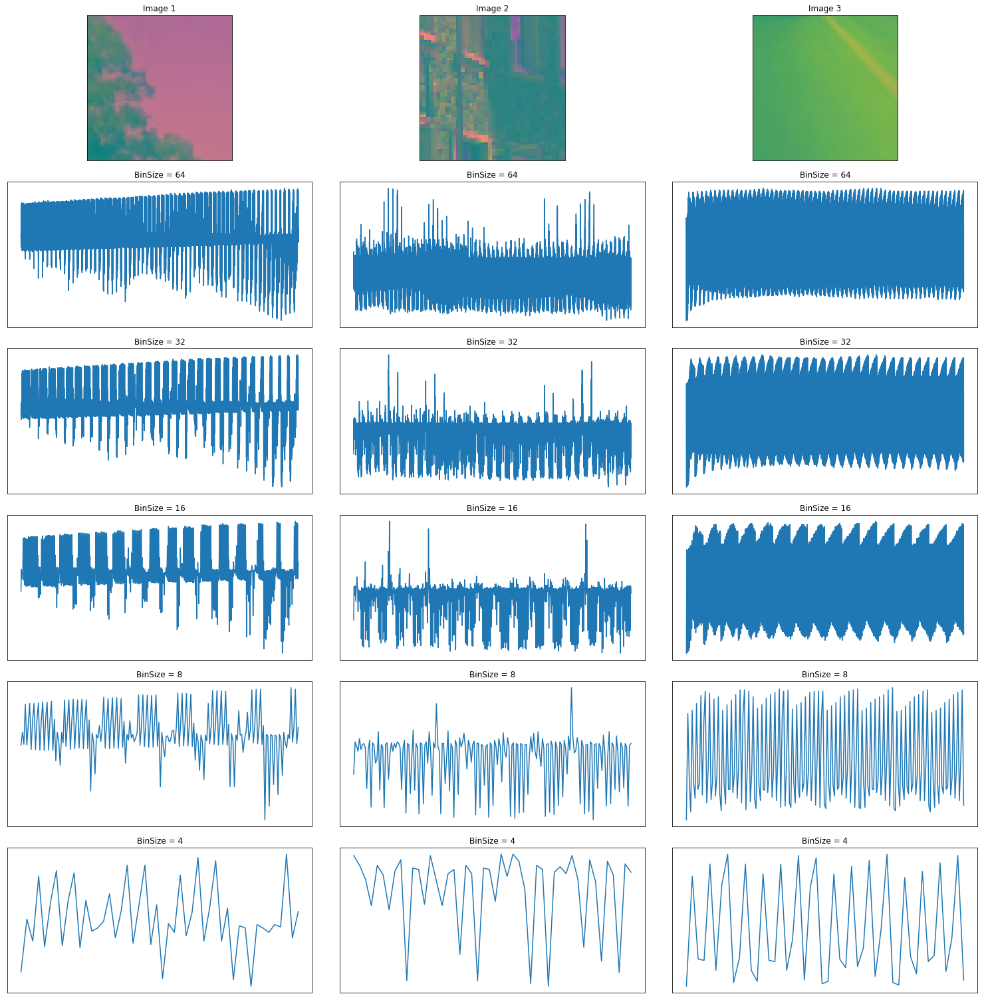

In [24]:
# Investigate color binning features for non-car images
investigate_color_binning_vector(test_images_non_cars, cv2.COLOR_RGB2YCrCb)

With only 3 examples investigated, strong conclusions should be avoided, but it seems like non-car images has a more repetetive pattern in general. At least down to binsize = 8, it is still possible to differentiate. Thus, it could be useful to include them in the classifier.

#### Color histogram
Color histograms are robust to variations in aspect and orientation of the object. By normalization, robust to image size as well.

In [25]:
# Create color histogram feature vector  
def create_color_histogram_features(image, n_bins=32):
    
    histograms = np.empty((0,), dtype=np.uint8)
    bin_centers = np.empty((0,), dtype=np.uint8)

    # Compute the histogram of each color channel separately
    for current_channel in range(image.shape[2]):
        
        # Create channel histogram
        channel_histogram = np.histogram(image[:,:,current_channel], bins=n_bins, range=(0, 256))
        channel_bin_edges = channel_histogram[1]
        channel_bin_centers = (channel_bin_edges[1:] + channel_bin_edges[0:len(channel_bin_edges)-1])/2
        
        # Assemble full histogram
        histograms = np.append(histograms, [channel_histogram[0]])
        bin_centers = np.append(bin_centers, [channel_bin_centers])

    return histograms, bin_centers

In [26]:
### Investigate color histogram vector
def investigate_color_histogram_vector(test_images, colorspace="", size_list=(64, 32, 16, 8, 4), *args):
    
    # Create subplot grid
    fig, axarr = plt.subplots(len(size_list)+1, test_images.shape[0], figsize=(21, 4*len(size_list)+1))
    fig.tight_layout()

    # Create color binning feature vectors for all test images
    for current_index in range(len(test_images)):

        # Convert image to requested colorspace
        if colorspace:
            current_image = cv2.cvtColor(test_images[current_index], colorspace)
        else:
            current_image = np.copy(test_images[current_index])

        # Plot original image
        axarr[0, current_index].imshow(current_image)
        axarr[0, current_index].get_xaxis().set_visible(False)
        axarr[0, current_index].get_yaxis().set_visible(False)
        axarr[0, current_index].set_title("Image {}".format(current_index+1))

        # Iterate over all bin sizes
        size_counter = 1
        for current_size in size_list:

            # Get feature vector
            feature_vector, bin_centers = create_color_histogram_features(current_image, current_size)

            # Plot feature vector
            axarr[size_counter, current_index].bar(bin_centers, feature_vector)
            axarr[size_counter, current_index].get_xaxis().set_visible(False)
            axarr[size_counter, current_index].get_yaxis().set_visible(False)
            axarr[size_counter, current_index].set_title("BinSize = {}".format(current_size))
            
            size_counter += 1

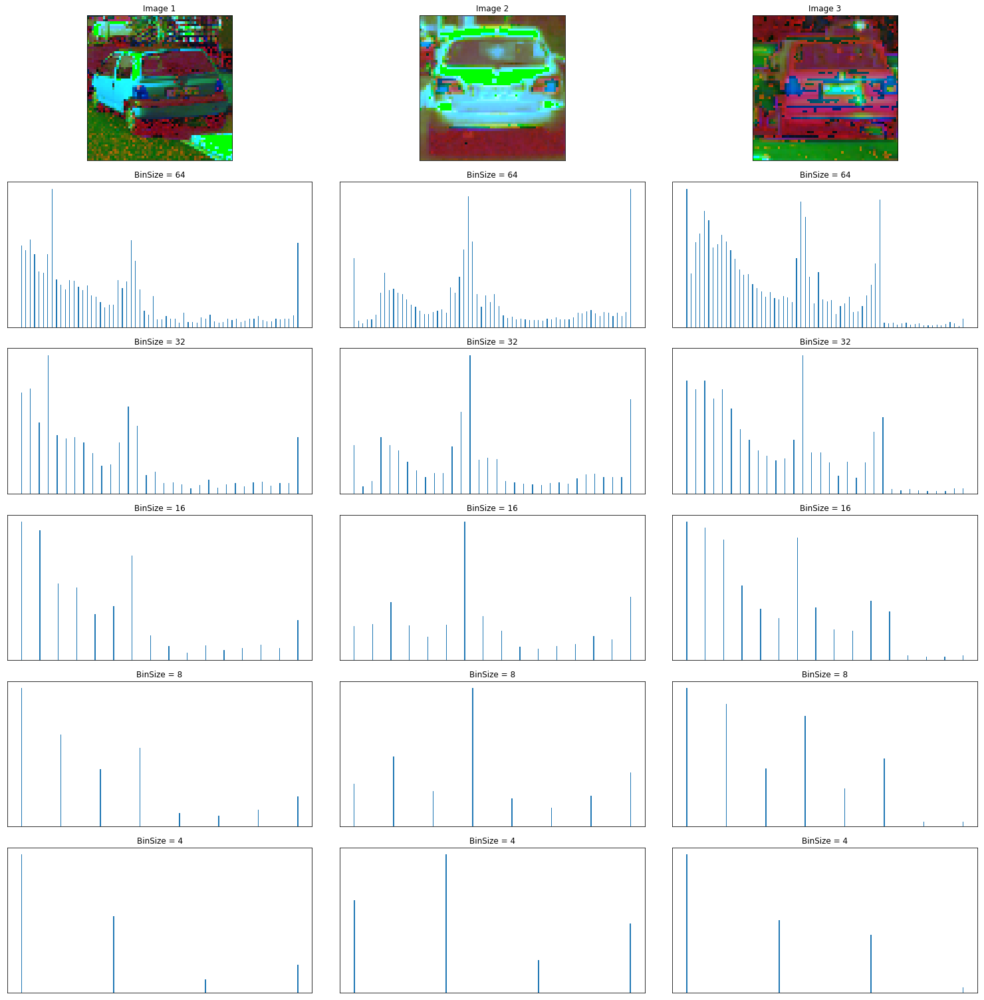

In [27]:
# Investigate color histogram features for car images
investigate_color_histogram_vector(test_images_cars, cv2.COLOR_RGB2HLS)

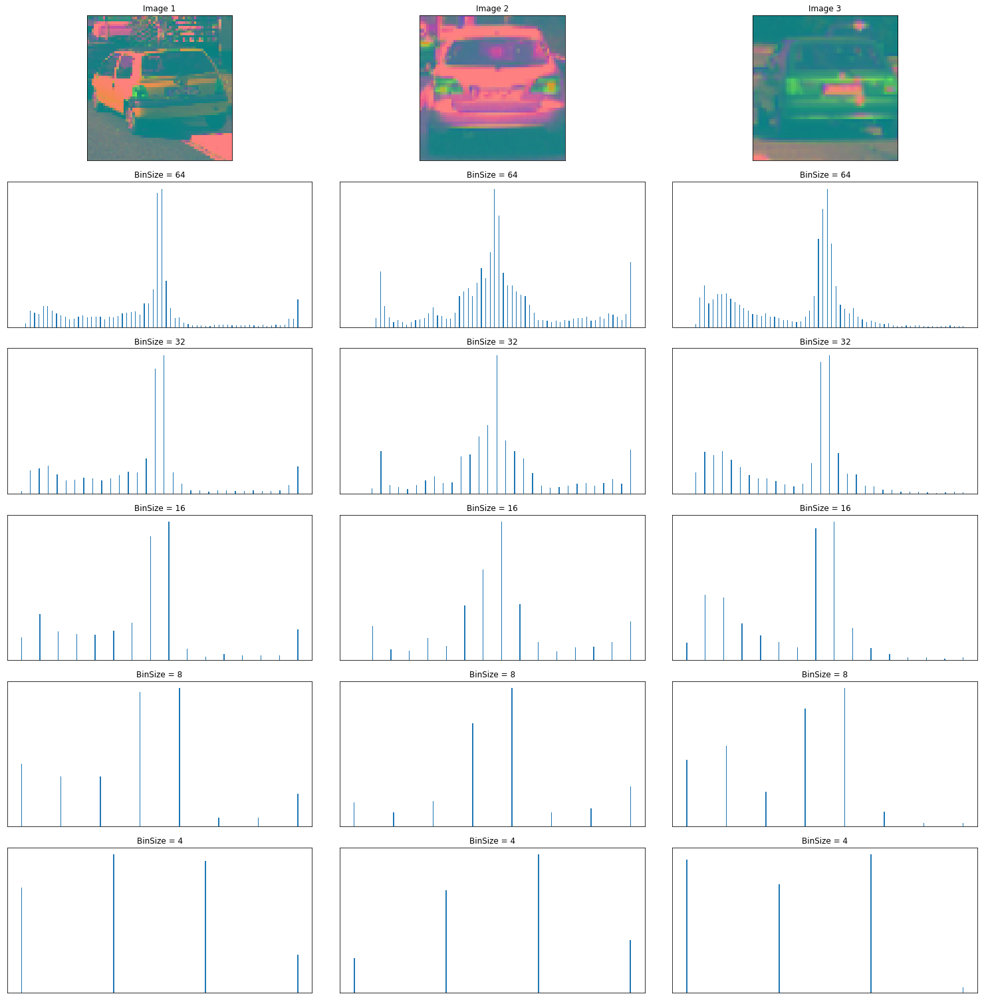

In [28]:
# Investigate color histogram features for car images
investigate_color_histogram_vector(test_images_cars, cv2.COLOR_RGB2YCrCb)

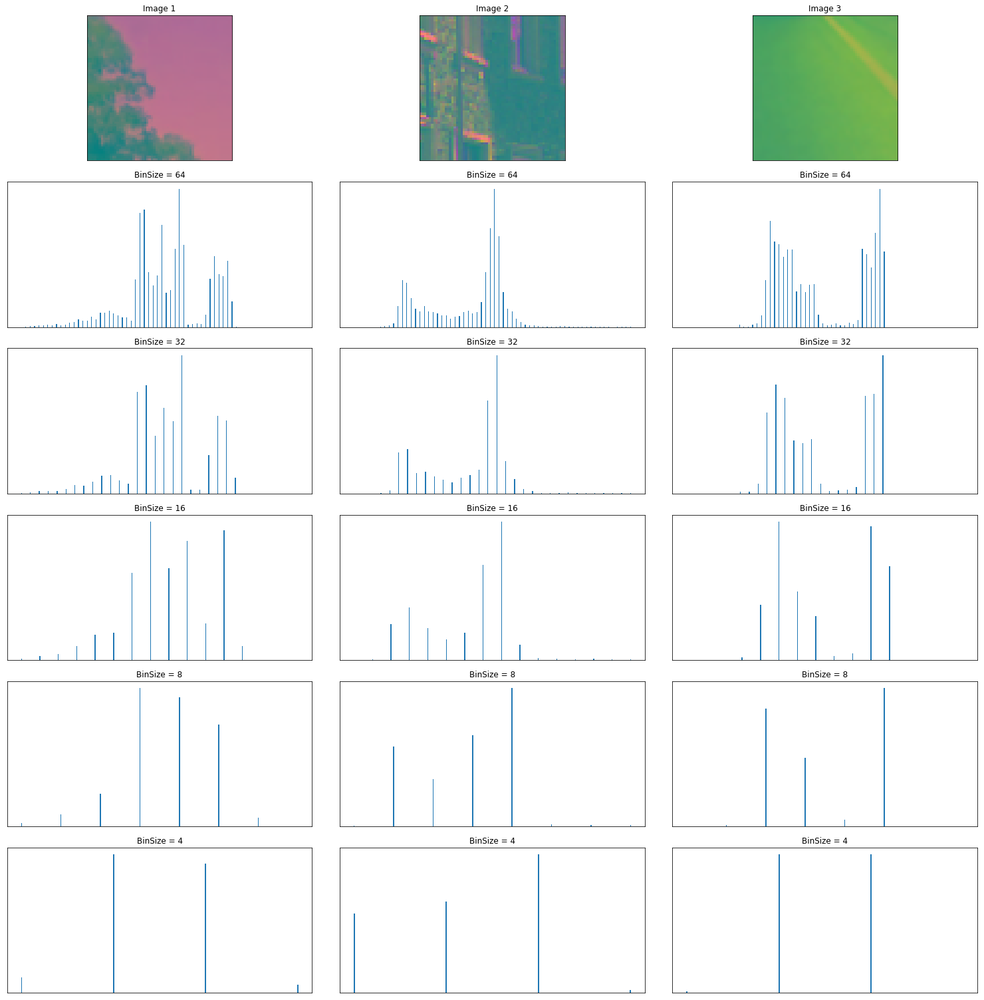

In [29]:
# Investigate color histogram features for non-car images
investigate_color_histogram_vector(test_images_non_cars, cv2.COLOR_RGB2YCrCb)

Bin size should not be too small...

### 2. Construct gradient features
Investigate the possibility of using the image gradient as features for the classifier.

#### Histogram of Oriented Gradients (HOG)
Compute the gradient magnitude and direction in each pixel. Group them in small cells, e.g. 8x8. Within each cell, create the histogram of gradient directions. Instead of just summing up the gradient direction counts, gradient magnitude is used to weight the contribution of each pixel. In this way, noise is suppressed.

The resulting feature vector provide some robustness of variations in object shape.  

To tune: #bins, grid of cells, cell size, cell overlap, block normalization (of intensity)

In [30]:
### Create HOG feature vector
def create_hog_features(image, channel, n_bins, pixels_per_cell, cells_per_block, feature_vector=False):

    # Create HOG feature for the desired color channel
    features, hog_image = hog(image[:,:,channel], orientations=n_bins,
                              pixels_per_cell=(pixels_per_cell, pixels_per_cell), 
                              cells_per_block=(cells_per_block, cells_per_block), 
                              visualise=True, feature_vector=feature_vector, block_norm="L2-Hys")

    return features, hog_image

In [31]:
### Investigate HOG feature vector
def investigate_hog_vector(test_images, colorspace="", n_bins=9, pixels_per_cell=8, cells_per_block=2):
    
    # Create subplot grid
    fig, axarr = plt.subplots(test_images.shape[0]+1, 3, figsize=(18, 6*test_images.shape[0]+1))
    fig.tight_layout()
    
    # Create color binning feature vectors for all test images
    for current_index in range(len(test_images)):
        
        # Convert image to requested colorspace
        if colorspace:
            current_image = cv2.cvtColor(test_images[current_index], colorspace)
        else:
            current_image = np.copy(test_images[current_index])

        # Plot original image
        axarr[0, current_index].imshow(current_image)
        axarr[0, current_index].get_xaxis().set_visible(False)
        axarr[0, current_index].get_yaxis().set_visible(False)
        axarr[0, current_index].set_title("Image {}".format(current_index+1))

        # Get HOG feature vector
        for current_channel in range(current_image.shape[2]):
            _, hog_plot = create_hog_features(current_image, current_channel, n_bins, pixels_per_cell, cells_per_block)

            # Plot HOG features
            axarr[current_channel+1, current_index].imshow(hog_plot, cmap="gray")
            axarr[current_channel+1, current_index].get_xaxis().set_visible(False)
            axarr[current_channel+1, current_index].get_yaxis().set_visible(False)
            axarr[current_channel+1, current_index].set_title( \
                "Bins={}, Pix/Cell={}, Cells/Block={}, Ch={}".format(n_bins, pixels_per_cell, cells_per_block, current_channel))

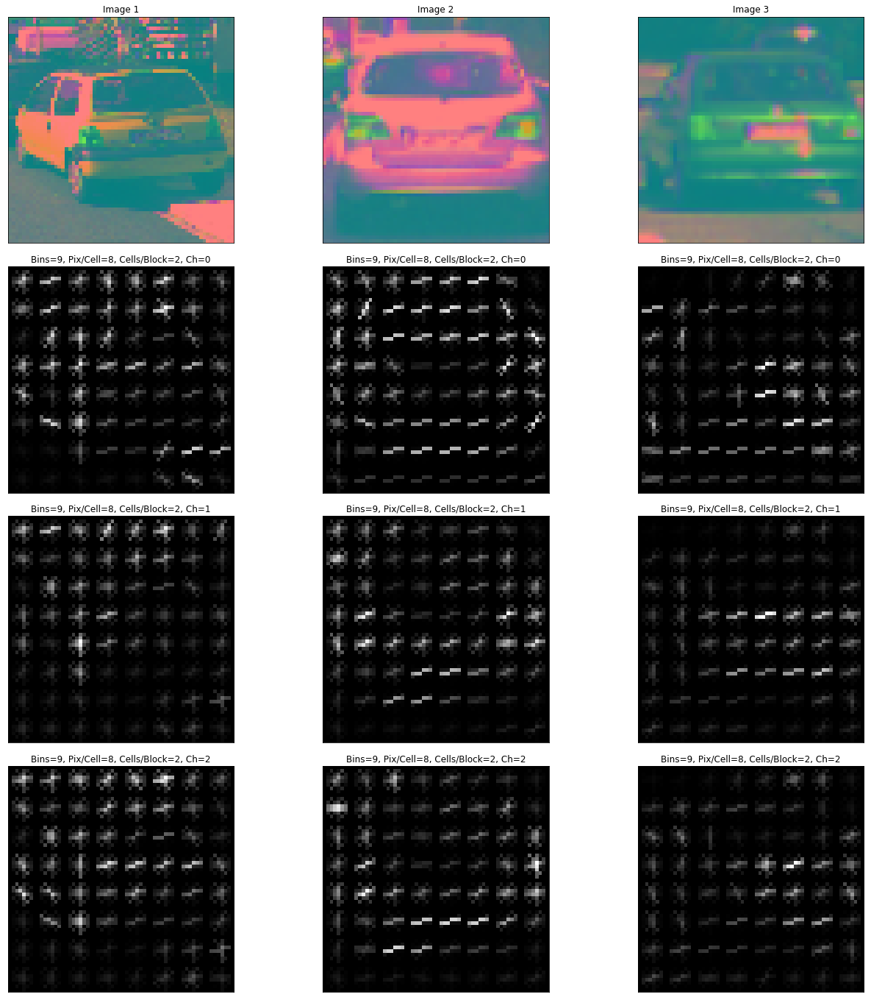

In [32]:
investigate_hog_vector(test_images_cars, cv2.COLOR_RGB2YCrCb)

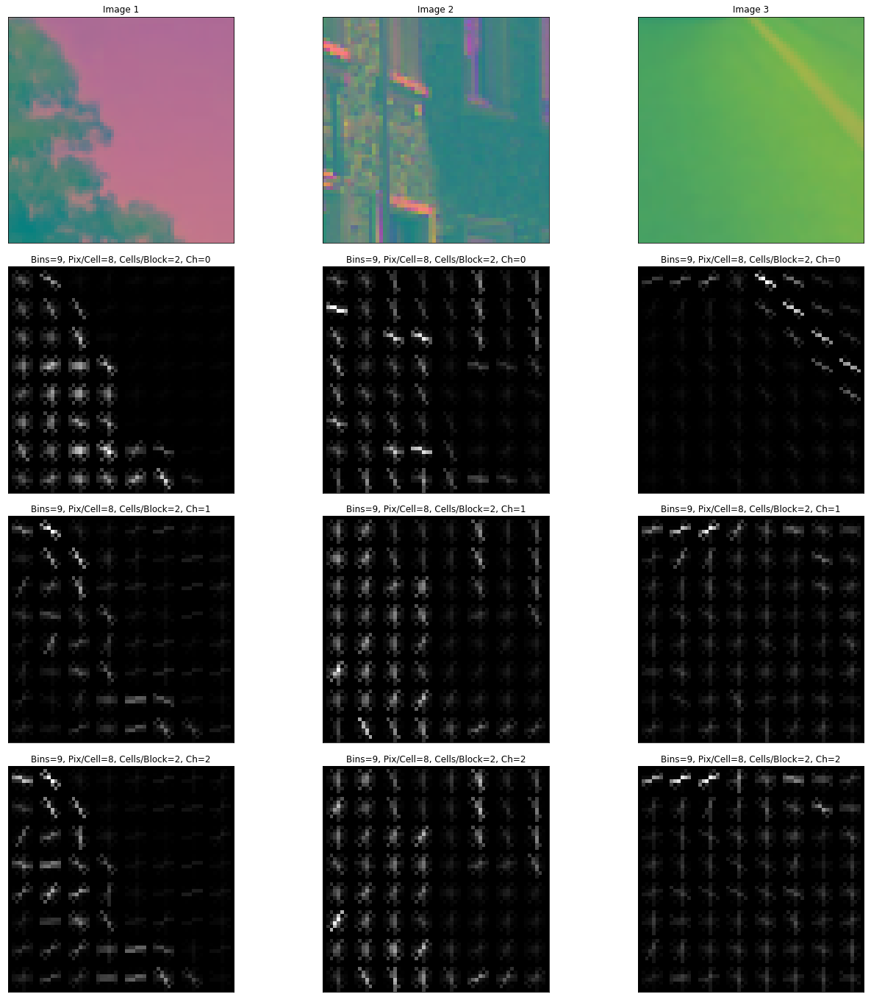

In [33]:
investigate_hog_vector(test_images_non_cars, cv2.COLOR_RGB2YCrCb)

Not easy to see difference in different colorspaces, but the fact is that the feature vectors are slightly different. The Y-channel seems to be the best to discern the cars, at least for the human eye.

### 3. Construct total feature vector

In [34]:
def create_image_features(image, colorspace="", 
                          add_color_binning_features=True, spatial_bin_size=(32, 32),
                          add_color_histogram_features=True, n_histogram_bins=32, 
                          add_hog_features=True, n_orientation_bins=9, pixels_per_cell=8, cells_per_block=2):    

    
    # Create the vector of all image features
    image_feature_vector = []
    
    # Convert image to requested colorspace
    if colorspace:
        current_image = cv2.cvtColor(image, colorspace)
    else:
        current_image = np.copy(image)

    # Extract color intensity features
    if add_color_binning_features:
        intensity_features = create_color_binning_features(current_image, size=spatial_bin_size)
        image_feature_vector.append(intensity_features)
        
    # Extract color histogram features 
    if add_color_histogram_features:
        histogram_features, _ = create_color_histogram_features(current_image, n_bins=n_histogram_bins)
        image_feature_vector.append(histogram_features)

    # Extract HOG features 
    if add_hog_features:
        for current_channel in range(current_image.shape[2]):
            hog_features, _ = create_hog_features(current_image, current_channel, 
                                                  n_bins=n_orientation_bins, pixels_per_cell=pixels_per_cell, 
                                                  cells_per_block=cells_per_block)

            image_feature_vector.append(hog_features.ravel())
        
    # Return complete feature vector
    return np.concatenate(image_feature_vector)

## Pre-process Dataset

### 1. Define dataset

In [35]:
### Read car/non-car cropouts
car_image_files = glob.glob('*training_data/vehicles/**/*.png')
non_car_image_files = glob.glob('*training_data/non-vehicles/**/*.png')

### 2. Explore dataset

In [36]:
# Check class balance
print("Number of car training examples = {}".format(len(car_image_files)))
print("Number of non-car training examples = {}".format(len(non_car_image_files)))

Number of car training examples = 8792
Number of non-car training examples = 8968


Classes are roughly balanced.

In [37]:
# Check image sie
image_size = cv2.imread(car_image_files[0]).shape
print("Image size = {}".format(image_size))

Image size = (64, 64, 3)


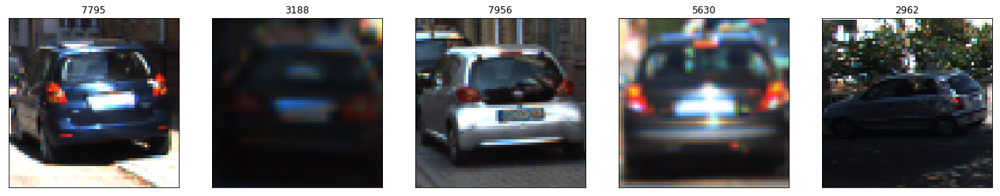

In [38]:
### Plot a few examples of car class
n_examples = 5
car_examples = np.empty((0,) + image_size, dtype=np.uint8)
car_indices = np.random.randint(0, len(car_image_files), n_examples)

for current_index in car_indices:
    current_image = cv2.imread(car_image_files[current_index]) 
    current_image = cv2.cvtColor(current_image, cv2.COLOR_BGR2RGB)
    car_examples = np.append(car_examples, [current_image], axis = 0)

plot_image_grid(car_examples, range(5), car_indices, n_examples)

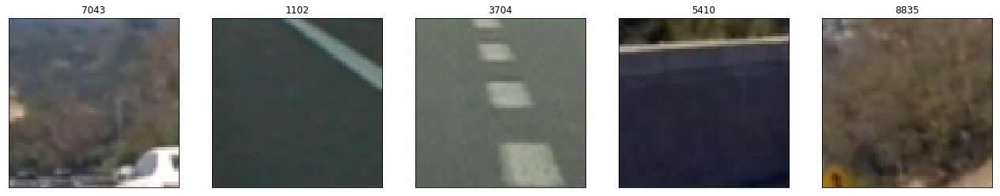

In [39]:
### Plot a few examples of non-car class
n_examples = 5
non_car_examples = np.empty((0,) + image_size, dtype=np.uint8)
non_car_indices = np.random.randint(0, len(non_car_image_files), n_examples)

for current_index in non_car_indices:
    current_image = cv2.imread(non_car_image_files[current_index]) 
    current_image = cv2.cvtColor(current_image, cv2.COLOR_BGR2RGB)
    non_car_examples = np.append(non_car_examples, [current_image], axis = 0)

plot_image_grid(non_car_examples, range(5), non_car_indices, n_examples)

### 3. Create feature tensor

In [40]:
### Configure feature constructors

# Color intensity features
spatial_bin_size = 32

# Color histogram features
n_histogram_bins = 32

# HOG features
n_orientation_bins = 9
pixels_per_cell = 8
cells_per_block = 2

# Total features
n_features = int(image_size[2]*(spatial_bin_size**2 + n_histogram_bins + 
                                n_orientation_bins*(cells_per_block**2)*
                                ((np.floor(image_size[0]/pixels_per_cell)) - cells_per_block + 1)**2))

print("#features in feature vector will be: {}".format(n_features))

#features in feature vector will be: 8460


In [41]:
def create_feature_tensor(image_files, dscription=""):
    
    # Scaler needs float
    feature_tensor = np.zeros((len(image_files), n_features), dtype=np.float64)
    index = 0

    # Iterate through the list of images and create a feature vector for each
    for current_file in tqdm(image_files, ascii=True, desc=dscription):

        # Create feature vector for current image
        current_image = cv2.imread(current_file)

        # OpenCV read images in BGR
        feature_vector = create_image_features(current_image, cv2.COLOR_BGR2YCrCb, 
                                               add_color_binning_features=True, spatial_bin_size=spatial_bin_size,
                                               add_color_histogram_features=True, n_histogram_bins=n_histogram_bins,
                                               add_hog_features=True, n_orientation_bins=n_orientation_bins,
                                               pixels_per_cell=pixels_per_cell, cells_per_block=cells_per_block)

        # Add feature vector for current image to feature tensor
        feature_tensor[index] = feature_vector
        index += 1
        
    return feature_tensor

In [42]:
car_feature_tensor = create_feature_tensor(car_image_files, "cars")
car_feature_tensor.shape

cars: 100%|##########| 8792/8792 [07:08<00:00, 20.43it/s]


(8792, 8460)

In [43]:
non_car_feature_tensor = create_feature_tensor(non_car_image_files, "non-cars")
non_car_feature_tensor.shape

non-cars: 100%|##########| 8968/8968 [07:14<00:00, 20.64it/s]


(8968, 8460)

In [44]:
### Concatenate feature tensors
# (Scaler needs float)
X_data = np.vstack((car_feature_tensor, non_car_feature_tensor)).astype(np.float64) 
X_data.shape

(17760, 8460)

### 4. Create label vector

In [45]:
### Define a labels vector based on features lists
Y_data = np.hstack((np.ones(len(car_feature_tensor)), np.zeros(len(non_car_feature_tensor))))
Y_data.shape

(17760,)

### 5. Normalize data
The features are a concatenation of several different concept, with different scales. Thus, the features must be normalized.

In [46]:
### Fit a feature standarization scaler
feature_scaler = StandardScaler().fit(X_data)

# Scale feature tensor
X_data_scaled = feature_scaler.transform(X_data)

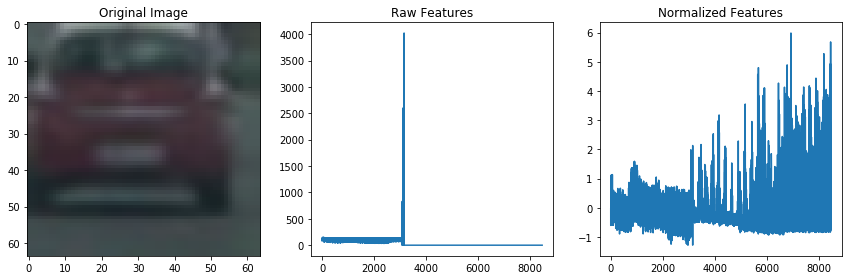

In [47]:
### Plot an example of raw and scaled features
index = 1000

fig = plt.figure(figsize=(12,4))
plt.subplot(131)
plt.imshow(cv2.cvtColor(cv2.imread(car_image_files[index]), cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.subplot(132)
plt.plot(X_data[index])
plt.title('Raw Features')
plt.subplot(133)
plt.plot(X_data_scaled[index])
plt.title('Normalized Features')
fig.tight_layout()

### 6. Train a classifier

In [48]:
# Split up data into shuffled training and validation sets
X_train, X_validation, Y_train, Y_validation = train_test_split(X_data_scaled, Y_data, test_size=0.2, random_state=42)

In [49]:
# Check that class balance roughly remains
print(Y_train.sum()/len(Y_train))
print(Y_validation.sum()/len(Y_validation))

0.495565878378
0.492961711712


In [50]:
### Do a grid search of best parameters for SVM
# For linear SVMs, 'C' is really the only paramtere to tune
hyper_parameters = {'C':[0.0001, 0.001, 0.01, 0.1, 1, 10]}
linear_svm = LinearSVC()
grid_search = GridSearchCV(linear_svm, hyper_parameters)
grid_search.fit(X_train, Y_train)

# Print best parameters
grid_search.best_params_

{'C': 0.001}

In [51]:
### Train a linear SVC (support vector classifier) using best C

# Switch to SVC with linear kernel to get hold of the probability estimates (used for thresholding later).
# LinearSVC and SVC have different mathematical formulations and so lead to slightly different decision surfaces,
# but the regularization should be similar.
svc = SVC(C=0.001, kernel="linear", probability=True)
svc.fit(X_train, Y_train)

print("Training accuracy =", svc.score(X_train, Y_train))
print("Validation accuracy =", svc.score(X_validation, Y_validation))

Training accuracy = 0.999788851351
Validation accuracy = 0.991554054054


## Sliding Windows
Search for cars with sliding windows. To increase efficiency:

1. Cars can only be located in the lower half of the camera image, so limit search to that area
2. Use smaller search windows nearer the horizon to account for apparent size of cars

### Test images

In [52]:
### Create a copy of the test images from the car camera to work on
test_images_input_dir = "test_images/"
test_images_output_dir = "test_images_output/"
test_videos_output_dir = "test_videos_output/"

# Create output dirs
if not os.path.exists(test_images_output_dir):
    os.makedirs(test_images_output_dir)

if not os.path.exists(test_videos_output_dir):
    os.makedirs(test_videos_output_dir)

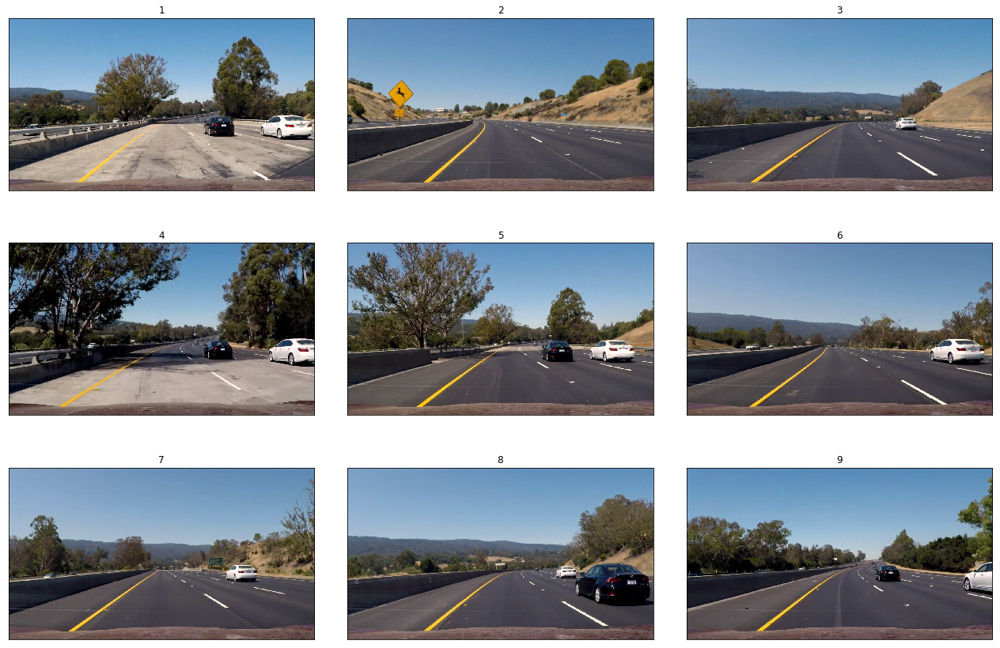

In [53]:
### Read test images from video
test_images_dir = "./test_images/"
test_images = create_image_test_set(test_images_dir, (720, 1280, 3))
plot_image_grid(test_images, range(0, test_images.shape[0]), range(1, test_images.shape[0]+1), 3, fig_size=(18,12))

### Sliding windows generator

In [54]:
### Generate search windows in region of interest
def generate_search_windows(image, x_min_max=[None, None], y_min_max=[None, None], 
                            window_size=(64, 64), window_overlap=(0.5, 0.5)):
    
    # Define region of interest
    if not x_min_max[0]:
        x_min_max[0] = 0
    if not x_min_max[1]:
        x_min_max[1] = image.shape[1]
        
    if not y_min_max[0]:
        y_min_max[0] = 0
    if not y_min_max[1]:
        y_min_max[1] = image.shape[0]
        
    # Calculate the number of windows in each direction
    x_span = x_min_max[1] - x_min_max[0]
    y_span = y_min_max[1] - y_min_max[0]
    
    n_pix_per_step_x = np.int(window_size[0]*(1 - window_overlap[0]))
    n_pix_per_step_y = np.int(window_size[1]*(1 - window_overlap[1]))
    
    n_buffer_x = np.int(window_size[0]*(window_overlap[0]))
    n_buffer_y = np.int(window_size[1]*(window_overlap[1]))

    n_windows_x = np.int((x_span-n_buffer_x)/n_pix_per_step_x) 
    n_windows_y = np.int((y_span-n_buffer_y)/n_pix_per_step_y) 
    
    # Initialize a list to append window positions to
    window_list = []
    
    # Loop through finding x and y window positions
    for current_y in range(n_windows_y):
        for current_x in range(n_windows_x):
            
            # Calculate window position
            start_x = current_x*n_pix_per_step_x + x_min_max[0]
            end_x = start_x + window_size[0]
            
            start_y = current_y*n_pix_per_step_y + y_min_max[0]
            end_y = start_y + window_size[1]
            
            # Append window position to list
            window_list.append(((start_x, start_y), (end_x, end_y)))
            
    # Return the list of windows
    return window_list

In [55]:
### Test how to configure sliding window sizes and search areas
def configure_sliding_windows(image, y_min_max=(0, 720), window_size=(64, 64), window_overlap=(0, 0)):
    
    # Generate windows
    windows = generate_search_windows(image, y_min_max=y_min_max, window_size=window_size, 
                                      window_overlap=window_overlap)

    # Visualize windows
    window_image = draw_boxes(image, windows, color=(0, 0, 255), line_thickness=6) 
    plt.figure(figsize=(12, 8))
    _ = plt.imshow(window_image)    

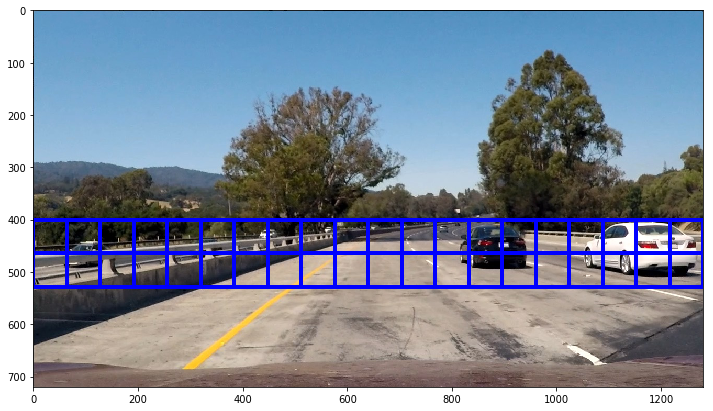

In [56]:
# Configure sliding window mechanism
y_min_max = (400, 528)
window_size = (64, 64)
window_overlap = (0, 0)

configure_sliding_windows(test_images[0], y_min_max, window_size, (0,0))

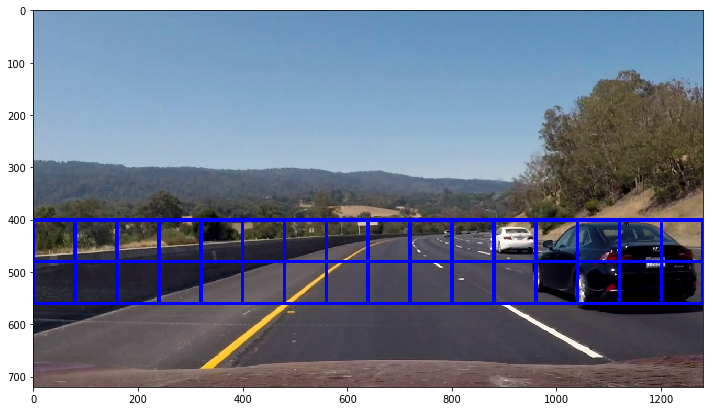

In [57]:
# Configure sliding window mechanism
y_min_max = (400, 560)
window_size = (80, 80)
window_overlap = (0, 0)

configure_sliding_windows(test_images[7], y_min_max, window_size, (0,0))

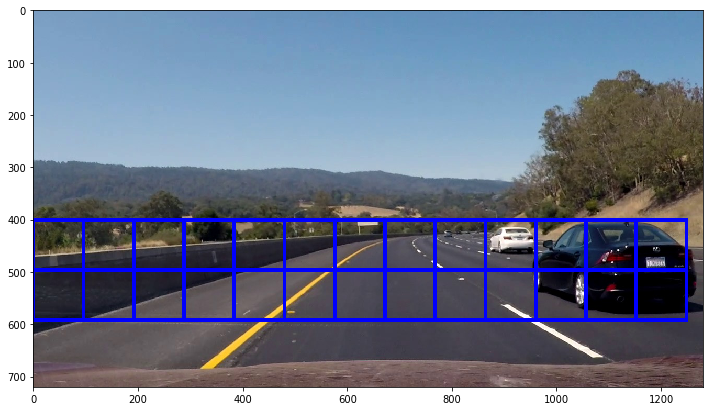

In [58]:
# Configure sliding window mechanism
y_min_max = (400, 592)
window_size = (96, 96)
window_overlap = (0, 0)

configure_sliding_windows(test_images[7], y_min_max, window_size, (0,0))

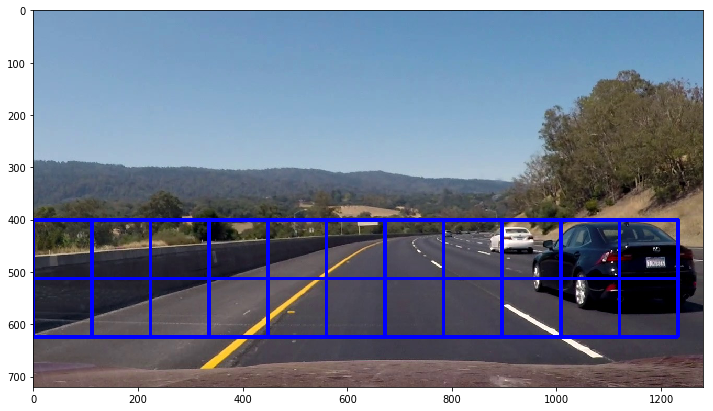

In [59]:
# Configure sliding window mechanism
y_min_max = (400, 624)
window_size = (112, 112)
window_overlap = (0, 0)

configure_sliding_windows(test_images[7], y_min_max, window_size, (0,0))

### HOG Sub-sampler

In [60]:
# Extract HOG features for the entire region of interest at the same time, and then subsample from it.
# (Built upon similar function from Udacity lesson)
def find_cars(img, xstart, xstop, ystart, ystop, scale, svc, X_scaler, 
              orient, pix_per_cell, cell_per_block, spatial_size, hist_bins):
    
    # Create an empty list to receive positive detection windows
    windows_with_cars = []

    # Extract ROI and scale patch to 64x64 as expected by classifier
    img_tosearch = img[ystart:ystop,xstart:xstop,:]
    ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YCrCb)
    
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pixels per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1, _ = create_hog_features(ctrans_tosearch, 0, orient, pix_per_cell, cell_per_block, feature_vector=False)
    hog2, _ = create_hog_features(ctrans_tosearch, 1, orient, pix_per_cell, cell_per_block, feature_vector=False)
    hog3, _ = create_hog_features(ctrans_tosearch, 2, orient, pix_per_cell, cell_per_block, feature_vector=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = create_color_binning_features(subimg, size=spatial_bin_size)
            hist_features, _ = create_color_histogram_features(subimg, n_bins=n_histogram_bins)

            # Scale features 
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))    
            test_prediction = svc.predict_proba(test_features)
            
            # Make a prediction and threshold the probability to reduce false positives
            if test_prediction[0][1] > 0.9:
                
                # Add patch as a probable car position
                xbox_left = np.int(xleft*scale) + xstart
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)

                windows_with_cars.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                
    return windows_with_cars

In [61]:
### Verify how each window scale detects cars
def verify_car_detection(y_min_max, windows_scale):

    # Run search on all images in test set
    image_set = np.empty((0,) + test_images.shape[1:4], dtype=np.uint8)

    for current_index in range(len(test_images)):
        windows_with_cars = find_cars(test_images[current_index], 448, 1280, y_min_max[0], y_min_max[1], 
                                      windows_scale, svc, feature_scaler, 
                                      n_orientation_bins, pixels_per_cell, cells_per_block, 
                                      spatial_bin_size, n_histogram_bins)

        processed_image = draw_boxes(test_images[current_index], windows_with_cars, color=(0, 0, 255), line_thickness=6)
        image_set = np.append(image_set, [processed_image], axis = 0)

    plot_image_grid(image_set, range(0, image_set.shape[0]), range(1, image_set.shape[0]+1), 3, fig_size=(18,12))

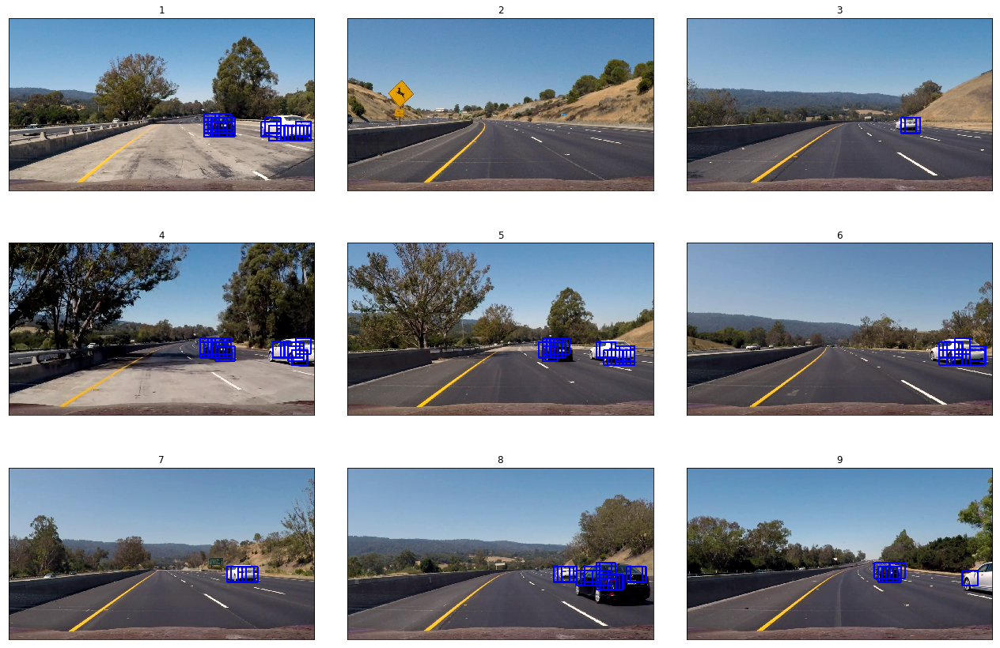

In [62]:
### Test car finder
y_min_max = (400, 528)
windows_scale = 1    

verify_car_detection(y_min_max, windows_scale)

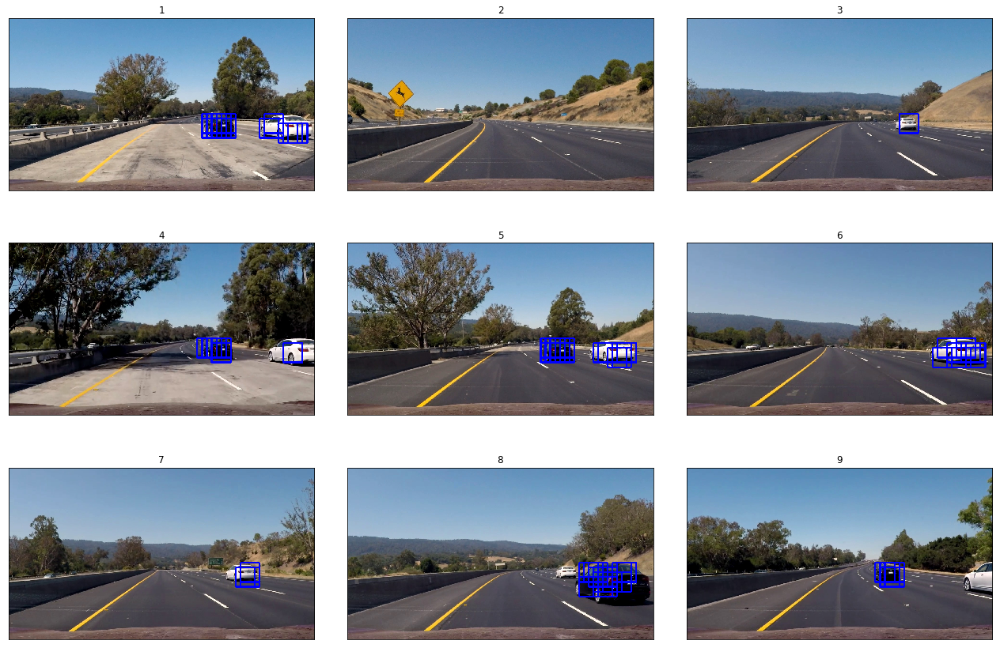

In [63]:
### Test car finder
y_min_max = (400, 560)
windows_scale = 1.25   

verify_car_detection(y_min_max, windows_scale)

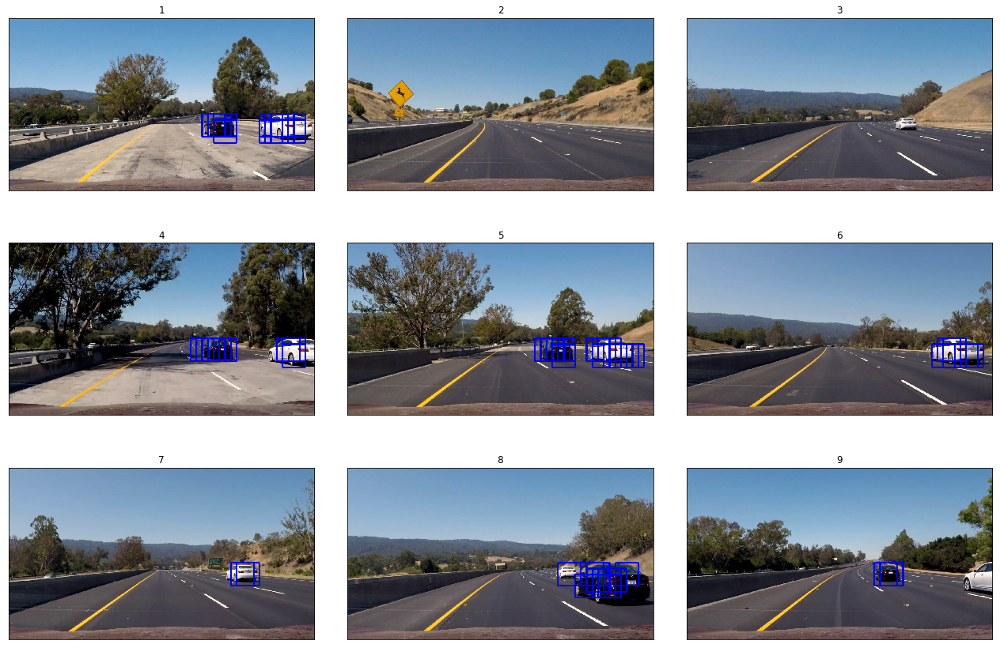

In [64]:
### Test car finder
y_min_max = (400, 592)
windows_scale = 1.5   

verify_car_detection(y_min_max, windows_scale)

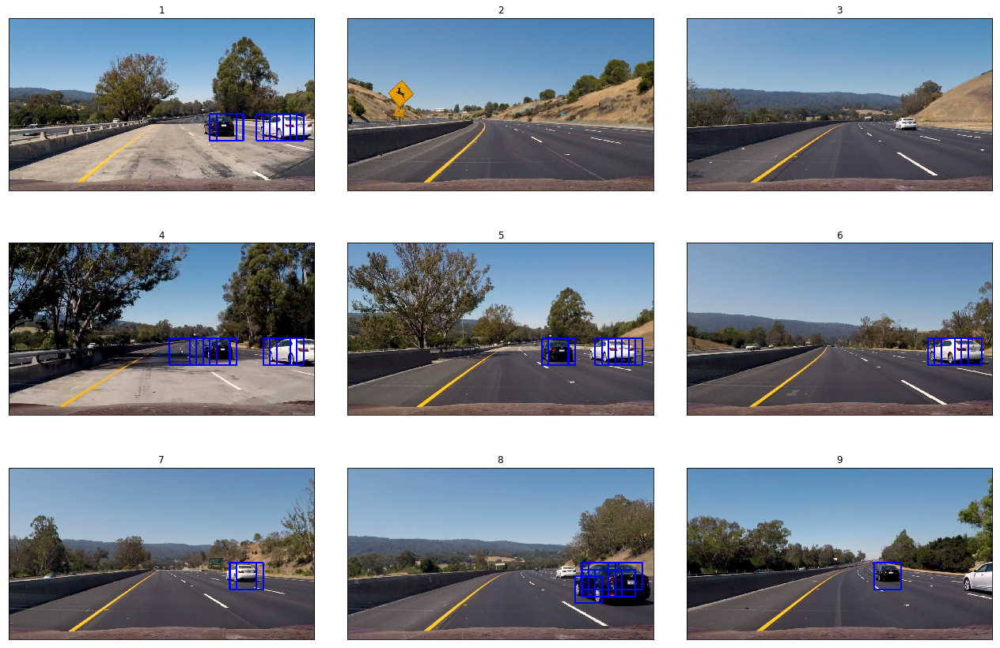

In [65]:
### Test car finder
y_min_max = (400, 624)
windows_scale = 1.75   

verify_car_detection(y_min_max, windows_scale)

Most window schemes give good detections, but scale 1.75 fails in both image 3 and 8. Use the other three scales.

### Smoothing Filter
Filter out false positives.

In [66]:
class SmoothingFilter():
    
    # Init variables
    def __init__(self, heatmap_threshold=3, memory_length=8):
        
        # Create a heatmap memory to render more stable bounding boxes
        self.heatmap_threshold = heatmap_threshold
        self.heatmap_memory = deque(maxlen=memory_length)
        
        # Remember bounding box midpoints for sanity checking of detections
        self.valid_boxes = np.empty((0, 2), dtype=np.uint8)

    # Add heatmap to memory
    def add_heatmap(self, image, bbox_list):
        
        current_heatmap = np.zeros_like(image[:,:,0]).astype(np.float)
        
        # Iterate through list of bboxes
        for box in bbox_list:
            # Add += 1 for all pixels inside each bbox
            # Assuming each "box" takes the form ((x1, y1), (x2, y2))
            current_heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

        # Zero out pixels below the threshold
        current_heatmap[current_heatmap < self.heatmap_threshold] = 0
        self.heatmap_memory.append(np.clip(current_heatmap, 0, 255))

    # Reset heatmap memory
    def clear_heatmap_memory(self):

        self.heatmap_memory.clear()
        
    def get_heatmap(self):
        return np.sum(self.heatmap_memory, axis=0)
        
    # Perform sanity check of a detection bbox
    def sanity_check_bbox(self, bbox):

        # Calculate midpoint of bbox to sanity check
        midpoint = np.array(np.add(bbox[1], bbox[0])//2)

        # A box must be near a previous box
        if (len(self.valid_boxes) > 0):
            diffs = self.valid_boxes - midpoint
            dists = np.sqrt(diffs[:,0]**2 + diffs[:,1]**2)
            
            if np.any(dists < 50.0):
                # Yes, it is near. Treat as valid
                return True

        # If not near a previous one, valid new boxes must appear from either side, 
        # or near the horizon (catching up)
        return ((bbox[0][0] < 80) or (bbox[1][0] > 1200) or (bbox[1][1] < 500))
        
    # Draw bboxes on image
    def draw_labeled_bboxes(self, image, color=(0, 0, 255), line_thickness=6):

        # Create a copy to draw bboxes on
        bbox_image = np.copy(image)
        validated_boxes = np.empty((0, 2), dtype=np.uint8)

        # Find final boxes from integrated heatmap
        labels = label(np.sum(self.heatmap_memory, axis=0))

        # Iterate through all detections
        for current_cluster in range(1, labels[1]+1):
            
            # Find pixels with each car_number label value
            nonzero_pixels = (labels[0] == current_cluster).nonzero()

            # Identify x and y values of those pixels
            non_zero_x = np.array(nonzero_pixels[1])
            non_zero_y = np.array(nonzero_pixels[0])

            # Define a bounding box based on min/max x/y
            bbox = ((np.min(non_zero_x), np.min(non_zero_y)), (np.max(non_zero_x), np.max(non_zero_y)))
            
            # Sanity check the bbox
            if self.sanity_check_bbox(bbox):

                # Draw the box on the image
                cv2.rectangle(bbox_image, bbox[0], bbox[1], color, line_thickness)

                # Remember bbox midpoint
                validated_boxes = np.append(validated_boxes, [np.add(bbox[1], bbox[0])//2], axis=0)

        # Save validated bboxes
        self.valid_boxes = np.copy(validated_boxes)

        return bbox_image

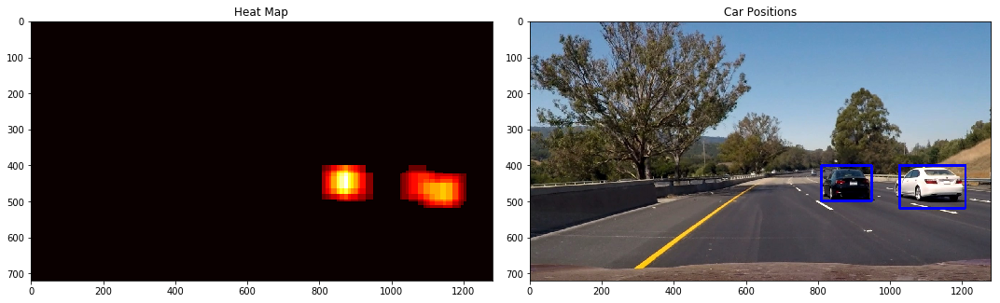

In [67]:
# Test heatmapping
smoothing_filter = SmoothingFilter()

win_64 = find_cars(test_images[4], 448, 1280, 400, 528, 1, svc, feature_scaler, 
                   n_orientation_bins, pixels_per_cell, cells_per_block, spatial_bin_size, n_histogram_bins)

win_80 = find_cars(test_images[4], 448, 1280, 400, 560, 1.25, svc, feature_scaler, 
                   n_orientation_bins, pixels_per_cell, cells_per_block, spatial_bin_size, n_histogram_bins)

win_96 = find_cars(test_images[4], 448, 1280, 400, 592, 1.5, svc, feature_scaler, 
                   n_orientation_bins, pixels_per_cell, cells_per_block, spatial_bin_size, n_histogram_bins)

smoothing_filter.add_heatmap(test_images[4], win_64 + win_80 + win_96)
box_image = smoothing_filter.draw_labeled_bboxes(test_images[4])

fig = plt.figure(figsize=(15,8))
plt.subplot(121)
plt.imshow(smoothing_filter.get_heatmap(), cmap='hot')
plt.title('Heat Map')
plt.subplot(122)
plt.imshow(box_image)
plt.title('Car Positions')
fig.tight_layout()

## Image Pipeline
Piece together all the image operations into a pipeline for processing video frames.

In [68]:
def image_pipeline(image):
    
    # 1. Find image patches with cars in them
    
    # 64x64 patches
    windows_with_cars_1 = find_cars(image, 448, 1280, 400, 528, 1, 
                                    svc, feature_scaler, 
                                    n_orientation_bins, pixels_per_cell, cells_per_block, 
                                    spatial_bin_size, n_histogram_bins)

    # 80x80 patches
    windows_with_cars_2 = find_cars(image, 448, 1280, 400, 560, 1.25,
                                    svc, feature_scaler, 
                                    n_orientation_bins, pixels_per_cell, cells_per_block, 
                                    spatial_bin_size, n_histogram_bins)
    
    # 96x96 patches
    windows_with_cars_3 = find_cars(image, 448, 1280, 400, 592, 1.5,
                                    svc, feature_scaler, 
                                    n_orientation_bins, pixels_per_cell, cells_per_block, 
                                    spatial_bin_size, n_histogram_bins)

    all_windows = windows_with_cars_1 + windows_with_cars_2 + windows_with_cars_3
    
    # 2. Perform heatmapping to reduce false positives
    smoothing_filter.add_heatmap(image, all_windows)
    box_image = smoothing_filter.draw_labeled_bboxes(image)

    return box_image

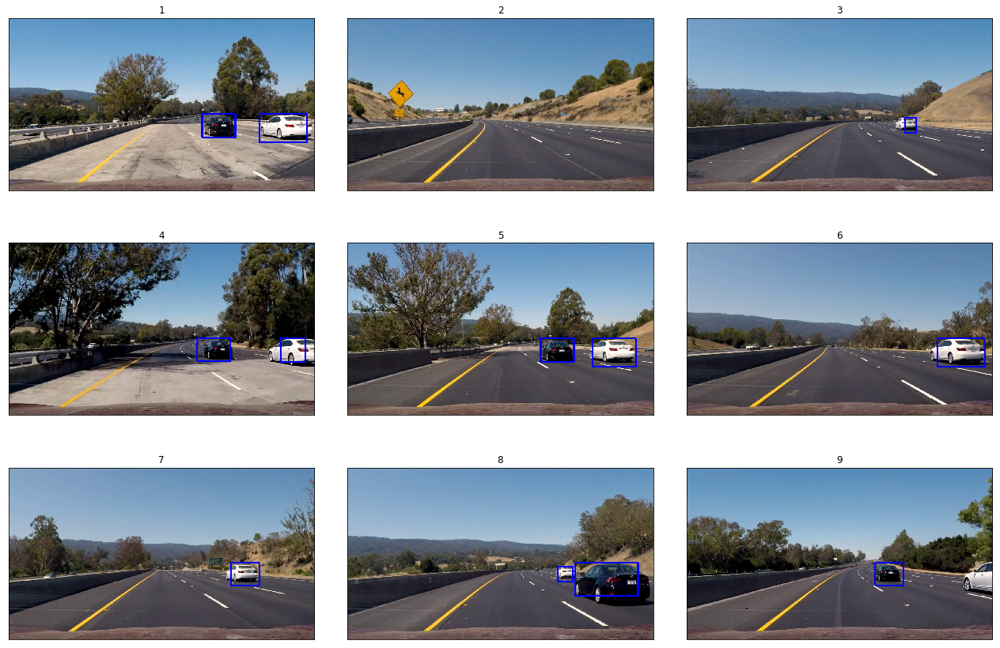

In [69]:
### Run pipeline on all test images
smoothing_filter = SmoothingFilter()
image_set = np.empty((0,) + test_images.shape[1:4], dtype=np.uint8)

for current_index in range(len(test_images)):
    smoothing_filter.clear_heatmap_memory()
    processed_image = image_pipeline(test_images[current_index])
    image_set = np.append(image_set, [processed_image], axis = 0)
    plt.imsave(os.path.join(test_images_output_dir, "test0{}.jpg".format(current_index+1)), processed_image)

plot_image_grid(image_set, range(0, image_set.shape[0]), range(1, image_set.shape[0]+1), 3, fig_size=(18,12))

## Videos

In [72]:
# Init
smoothing_filter = SmoothingFilter()

# Define video
project_video_output = 'test_videos_output/project_video.mp4'
clip1 = VideoFileClip("./project_video.mp4")

# Run clip through image pipeline
video_clip = clip1.fl_image(image_pipeline)
%time video_clip.write_videofile(project_video_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/project_video.mp4
[MoviePy] Writing video test_videos_output/project_video.mp4


100%|█████████▉| 1260/1261 [2:45:37<00:07,  7.98s/it] 


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/project_video.mp4 

CPU times: user 2h 44min 49s, sys: 54.9 s, total: 2h 45min 44s
Wall time: 2h 45min 38s


In [73]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_video_output))